In [4]:
import sys
from imageio import imread, imwrite
import numpy as np
from numba import jit # just in time compiling optimization
import matplotlib.pyplot as plt
from skimage import color
plt.rcParams["figure.figsize"] = (20,10)

# Seam Carving

Sometimes called 'content-aware-scale' (in the Photoshop suite for example), is an algortihm that allows us to rescale an image taking into account its content, shrinking only those parts that lack detail (i.e. an uniform blue sky), preserving the proportion of the 'detailed' objects.
It was developed by Shai Avidan and Ariel Shamir, with the purpose of image retargeting, which is the problem of displaying images without distortion on media of various sizes (cell phones, projection screens) using document standards, like HTML, that already support dynamic changes in page layout and text but not images.


We can describe it in 3 steps:
1. compute the level of "detail" (gradient/energy) for each pixel
2. find the connected vertical/horizontal path that passes through pixel with the least detail -> "seam"
3. remove that seam from the image and repeat from (2) the desired number of times

![A Seam Carving example](seam_carving.png)

Given the below energy function, seam carving is a very effective procedure that discards very little energy (not so far from optimal removal) compared to removing single pixels, columns, cropping, while also maintaining image shape.

![Energy preservation](energy_preservation.jpg)

The first step is to compute an energy value for every pixel, such that the more energy a pixel has, the less likely is to be carved out. Many energy mappings are possible (gradient magnitude, eye gaze movement, pixel entropy), but the original paper proposes:

$energy(I) = |\dfrac{\delta}{\delta x} I| + |\dfrac{\delta}{\delta y} I|$

Where I is the image. In my code I'll use convolution with two simple 3x3 Sobel kernels, giving me the horizontal and vertical derivatives while getting rid of some noise. Clearly, this is just an aproximation of the derivative, and different variations of sobel operators (or others) can be used to achieve different results.

$\dfrac{\delta}{\delta x} I = \begin{bmatrix} 1 & 0 & -1 \\2 & 0 & -2 \\ 1 & 0 & -1 \end{bmatrix} * I$

$\dfrac{\delta}{\delta y} I = \begin{bmatrix} 1 & 2 & 1 \\0 & 0 & 0 \\ -1 & -2 & -1 \end{bmatrix} * I$

In [5]:
from scipy.ndimage.filters import convolve

def energy_map(img):

    # convert image to grayscale for simple computation
    gray = color.rgb2gray(img)

    horiz_kernel = np.array([
        [1.0, 2.0, 1.0],
        [0.0, 0.0, 0.0],
        [-1.0, -2.0, -1.0]])

    vert_filter = np.array([
        [1.0, 0.0, -1.0],
        [2.0, 0.0, -2.0],
        [1.0, 0.0, -1.0]])

    convolved = abs(convolve(gray, horiz_kernel)) + abs(convolve(gray, vert_filter))

    return convolved

This way of computing the energy function can nicely describe details in pictorial images, but can lead to 0 energy values for different colors that map to the same grayscale value (as shown in an abstract image below, constructed to show this problem on purpose)

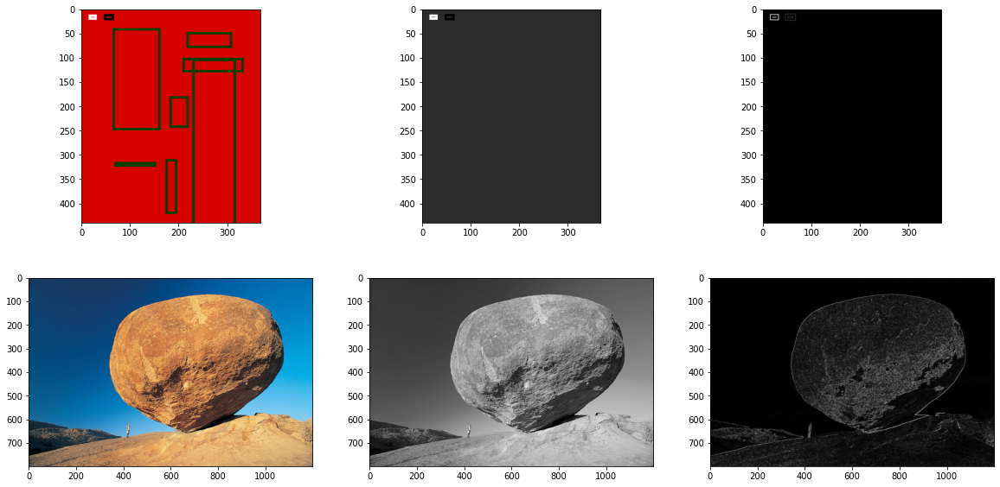

In [6]:
test_color = imread('color_diff.png')
rock = imread('rock.jpg')

gray_test = color.rgb2gray(test_color)
gray_rock = color.rgb2gray(rock)

test_energy = energy_map(test_color)
rock_energy = energy_map(rock)

plt.subplot(2,3,1)
plt.imshow(test_color)
plt.subplot(2,3,2)
plt.imshow(gray_test, cmap='gray')
plt.subplot(2,3,3)
plt.imshow(test_energy, cmap='gray')

plt.subplot(2,3,4)
plt.imshow(rock)
plt.subplot(2,3,5)
plt.imshow(gray_rock, cmap='gray')
plt.subplot(2,3,6)
plt.imshow(rock_energy, cmap='gray')

In [7]:
# better way to compute energy, considering 3 color channels
def energy_map(img):
    horiz_kernel = np.array([
        [1.0, 2.0, 1.0],
        [0.0, 0.0, 0.0],
        [-1.0, -2.0, -1.0]])

    vert_filter = np.array([
        [1.0, 0.0, -1.0],
        [2.0, 0.0, -2.0],
        [1.0, 0.0, -1.0]])

    # replicate 3 times (3x3x3 matrix) to apply it to each RGB channel
    horiz_kernel = np.stack([horiz_kernel] * 3, axis=2)
    vert_filter = np.stack([vert_filter] * 3, axis=2)

    img = img.astype('float32')
    convolved = abs(convolve(img, horiz_kernel)) + abs(convolve(img, vert_filter))

    # sum the energies in the red, green, and blue channels
    return convolved[:,:,0] + convolved[:,:,1] + convolved[:,:,2]

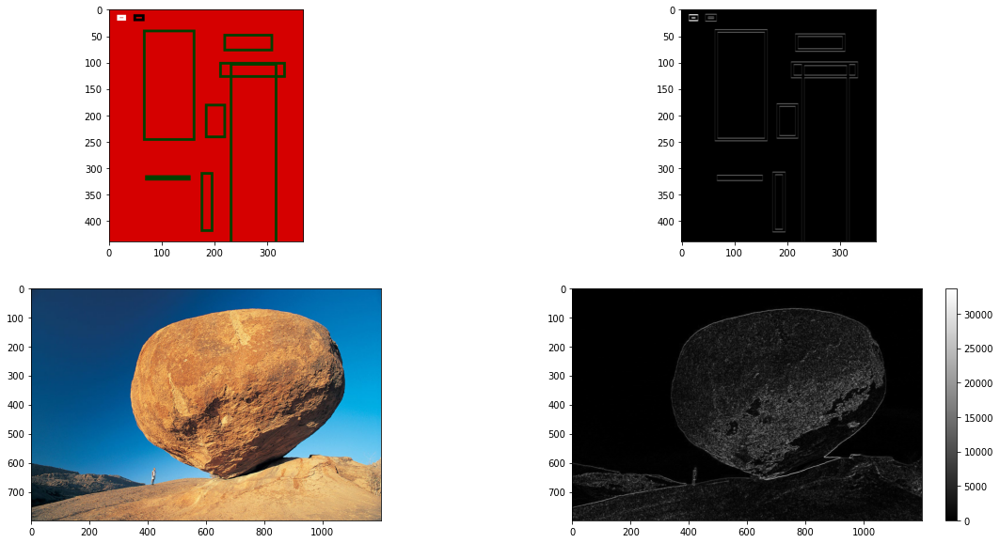

In [8]:
test_color = imread('color_diff.png')
rock = imread('rock.jpg')


test_energy = energy_map(test_color) # we can now see all the shapes
rock_energy = energy_map(rock) # still a good mapping

plt.subplot(2,2,1)
plt.imshow(test_color)
plt.subplot(2,2,2)
plt.imshow(test_energy, cmap='gray')
plt.subplot(2,2,3)
plt.imshow(rock)
plt.subplot(2,2,4)
plt.imshow(rock_energy, cmap='gray')
plt.colorbar()

## Computing seam energy & minimum seam
This energy map lets us find the path from the top of the image to the bottom of the image with the least energy. We can use dynamic programming to find this best sequence: M[i,j] will contain the smallest energy in that point, so we will need to backtrack from the last row of M.

$M[i,j] = energy[i,j] + min(M[i-1, j-1], M[i-1, j], M[i-1, j+1])$

In [9]:
@jit
def minimum_seam(img):
    
    r, c, d = img.shape
    M = energy_map(img) # start with all the energies already in place
    backtrack = np.zeros_like(M, dtype=np.int)
    
    for i in range(1, r):
        for j in range(c):
            if j == 0: # if we are on the first column, don't check the left j-1 cell
                idx = np.argmin(M[i-1, j:j+2]) # relative column 'index' [0,1] of previous cell (on previous line) with least energy
                backtrack[i, j] = idx + j # turn [0,1] in [j,j+1] to get actual column index and save it
                min_energy = M[i-1, idx+j] # minimum energy from the previous pixels
            else:
                idx = np.argmin(M[i-1, j-1:j+2])  # relative column 'index' [0,1,2] of previous cell (on previous line) with least energy
                backtrack[i, j] = idx+j-1 # turn [0,1,2] in [j-1,j,j+1] to get actual column index and save it
                min_energy = M[i-1, idx+j-1] # minimum energy from the previous pixels

            M[i, j] += min_energy # add the minimum energy up to that point to the energies

    return M, backtrack

## Carve out the minimum seam
We can follow the backtrack output from the dynamic programming step to form a mask of the pixels to delete

In [10]:
def carve_1_col(img):
    r, c, depth = img.shape

    M, backtrack = minimum_seam(img)

    # r x c matrix where False == part of seam to remove
    mask = np.ones((r, c), dtype=np.bool)
    # index of pixel on which to start: minimum from the last row
    j = np.argmin(M[-1])

    for i in reversed(range(r)): # going up from the last row
        # follow the path given by backtrack and mark 
        mask[i, j] = False
        j = backtrack[i, j]

    # mask needs to apply to all 3 channels
    mask = np.stack([mask] * 3, axis=2)

    # apply mask and resize with 1 less column
    img = img[mask].reshape((r, c - 1, depth))

    return img


## Use the effect
We repeat the 'carving' that removes 1 column a desired number of times, inversely proportional to the scaling factor

  0%|          | 0/600 [00:00<?, ?it/s]<ipython-input-9-c22bc6510519>:1: NumbaWarning: 
Compilation is falling back to object mode WITH looplifting enabled because Function "minimum_seam" failed type inference due to: Untyped global name 'energy_map': cannot determine Numba type of <class 'function'>

File "<ipython-input-9-c22bc6510519>", line 5:
def minimum_seam(img):
    <source elided>
    r, c, d = img.shape
    M = energy_map(img) # start with all the energies already in place
    ^

  @jit
<ipython-input-9-c22bc6510519>:1: NumbaWarning: 
Compilation is falling back to object mode WITHOUT looplifting enabled because Function "minimum_seam" failed type inference due to: Untyped global name 'energy_map': cannot determine Numba type of <class 'function'>

File "<ipython-input-9-c22bc6510519>", line 5:
def minimum_seam(img):
    <source elided>
    r, c, d = img.shape
    M = energy_map(img) # start with all the energies already in place
    ^

  @jit
/usr/local/lib/python3.7/dist-pa

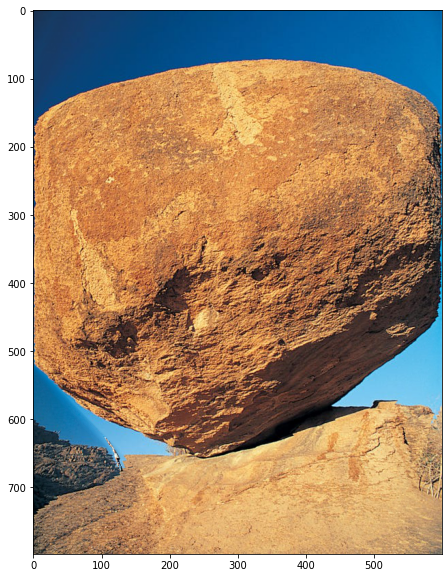

In [11]:
from tqdm import trange

def seam_carve_horiz(img, scale):
    r, c, _ = img.shape
    resized_c = int(scale * c)
    for _ in trange(c - resized_c):
        img = carve_1_col(img)
    return img

scale = 0.5
img = imread("rock.jpg")
out = seam_carve_horiz(img, scale)
# the rock, which has a lot of details, has been almost fully preserved, but
# the sky has been completely cut out: this is a very extreme example
plt.imshow(out)

  0%|          | 0/399 [00:00<?, ?it/s]<ipython-input-9-c22bc6510519>:1: NumbaWarning: 
Compilation is falling back to object mode WITH looplifting enabled because Function "minimum_seam" failed type inference due to: Untyped global name 'energy_map': cannot determine Numba type of <class 'function'>

File "<ipython-input-9-c22bc6510519>", line 5:
def minimum_seam(img):
    <source elided>
    r, c, d = img.shape
    M = energy_map(img) # start with all the energies already in place
    ^

  @jit
<ipython-input-9-c22bc6510519>:1: NumbaWarning: 
Compilation is falling back to object mode WITHOUT looplifting enabled because Function "minimum_seam" failed type inference due to: Untyped global name 'energy_map': cannot determine Numba type of <class 'function'>

File "<ipython-input-9-c22bc6510519>", line 5:
def minimum_seam(img):
    <source elided>
    r, c, d = img.shape
    M = energy_map(img) # start with all the energies already in place
    ^

  @jit
/usr/local/lib/python3.7/dist-pa

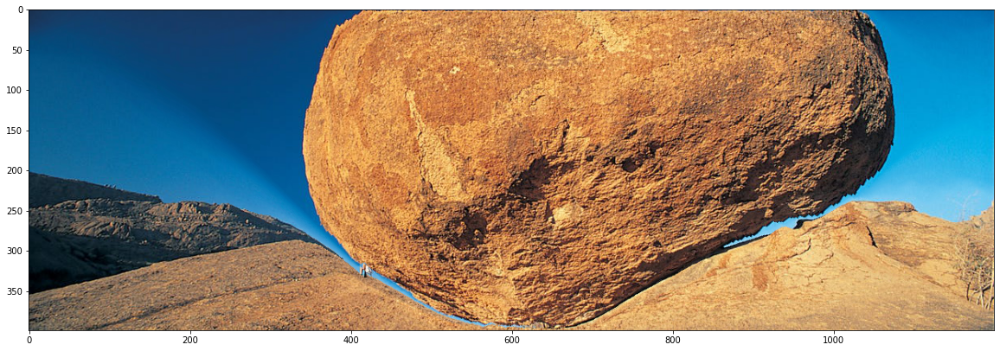

In [12]:
# it's easy to translate this compression in the vertical axis too:
# just rotate the image, apply the same procedure as above, then rotate back

def seam_carve_vert(img, scale):
    img = np.rot90(img, 1, (0, 1))
    img = seam_carve_horiz(img, scale)
    return np.rot90(img, 3, (0, 1))

scale = 0.5
out2 = seam_carve_vert(img, scale)
plt.imshow(out2)

100%|██████████| 399/399 [00:39<00:00, 10.15it/s]


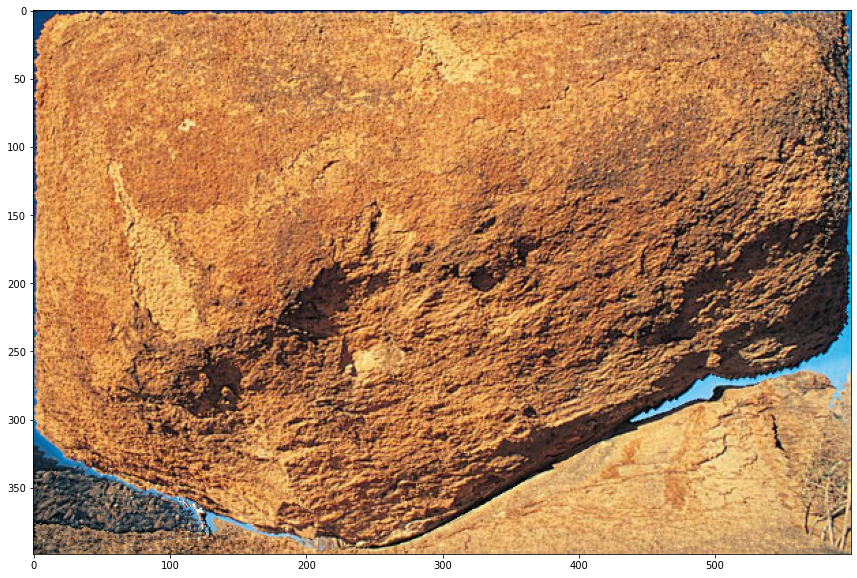

In [13]:
# define seam carving for both directions
def seam_carve(img, horiz_scale, vert_scale):
    img = seam_carve_horiz(img, horiz_scale)
    img = seam_carve_vert(img, horiz_scale)
    return img

out3 = seam_carve(img, 0.5, 0.5)
plt.imshow(out3)

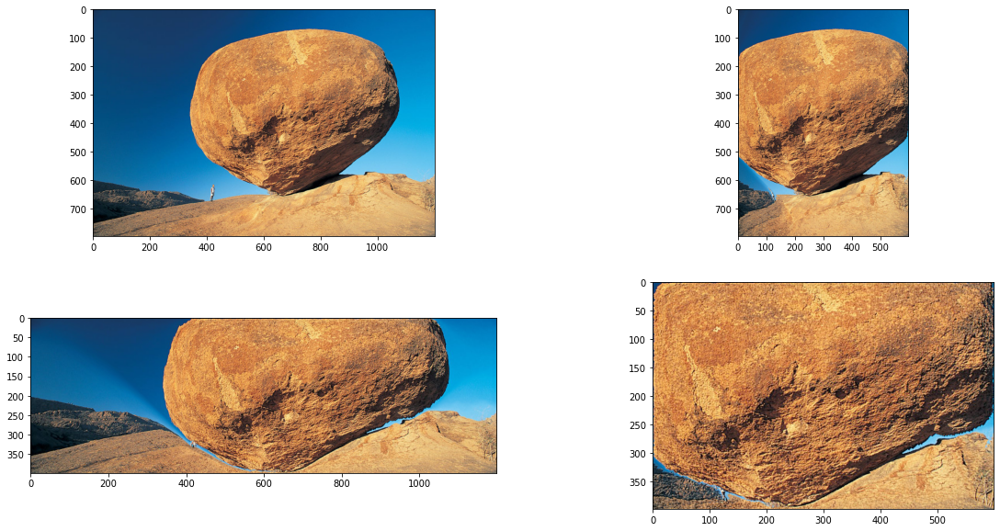

In [14]:
plt.subplot(2,2,1)
plt.imshow(img)
plt.subplot(2,2,2)
plt.imshow(out)
plt.subplot(2,2,3)
plt.imshow(out2)
plt.subplot(2,2,4)
plt.imshow(out3)

A scaling factor of 0.5 may be too much for this kind of image, and produces many artifacts, but in other cases it can lead to very good results, in which can be difficult to percieve the scaling if the original image is unknown:

100%|██████████| 192/192 [00:24<00:00,  7.85it/s]


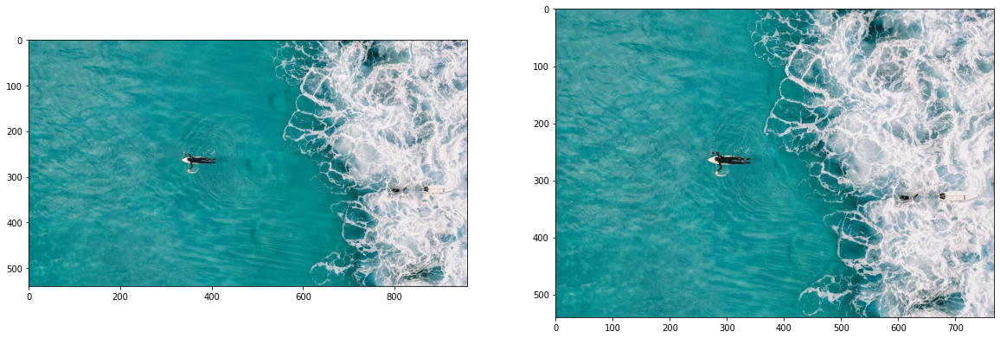

In [15]:
scale = 0.8
img = imread("surf.jpg")
out_surf = seam_carve_horiz(img, scale)

plt.subplot(1,2,1)
plt.imshow(img)
plt.subplot(1,2,2)
plt.imshow(out_surf)

This kind of effect is particularly useful to remove any uniform area from an image (for example a padding/frame) like the following:

100%|██████████| 99/99 [00:06<00:00, 16.49it/s]


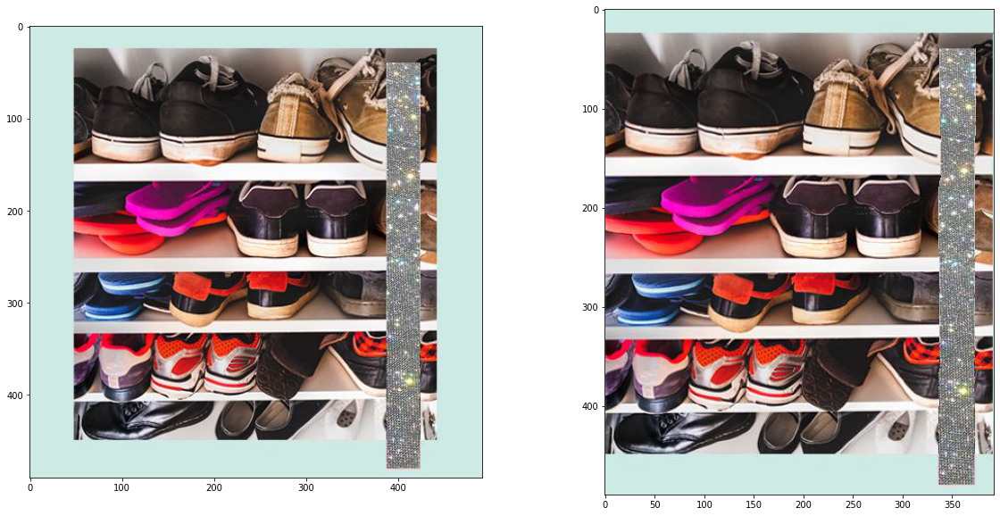

In [16]:
scale = 0.8
img_shoes = imread("shoes.jpg")
out4 = seam_carve_horiz(img_shoes, scale)

plt.subplot(1,2,1)
plt.imshow(img_shoes)
plt.subplot(1,2,2)
plt.imshow(out4)
# we can see that, with the right amount of rescaling, the horizontal part of
# the border has been removed without resizing the shoes at all

# Object deletion and preservation

Taking advantage of what se saw above, we can modify the original image or its energy map to make sure that the algorithms specifically cuts out (or preserves) some parts of the image.


For example we can 'erase' part of an image by covering it with an uniform spot of color: that part will have no detail and will be more likely to be carved out
by the algorithm (provided that the surrounding content doesn't have much detail, so that more seams will pass through it).

100%|██████████| 196/196 [00:06<00:00, 28.17it/s]


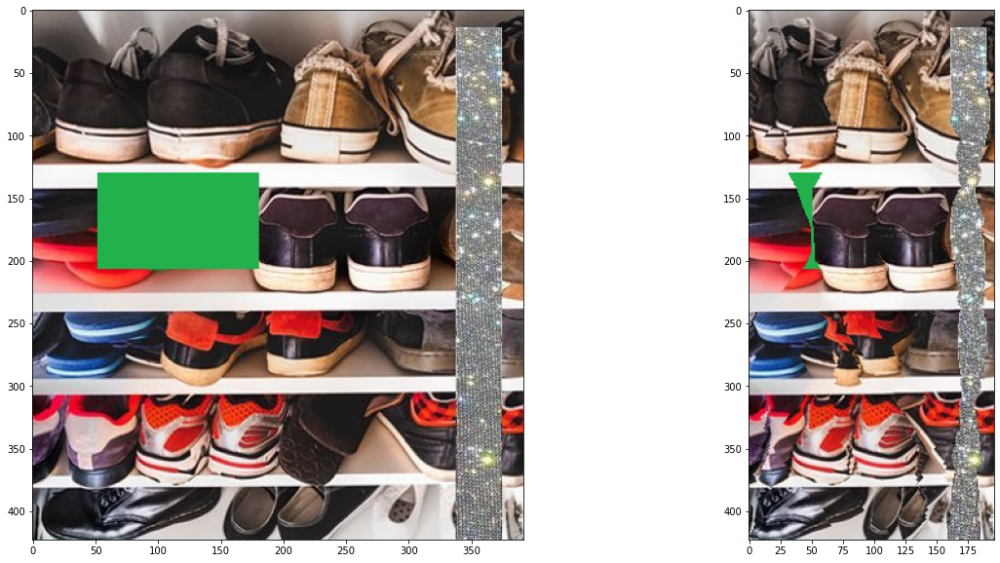

In [17]:
scale = 0.5
img_shoes2 = imread("shoes2.jpg")
out5 = seam_carve_horiz(img_shoes2, scale)

plt.subplot(1,2,1)
plt.imshow(img_shoes2)
plt.subplot(1,2,2)
plt.imshow(out5)

We can see that the result is good (most of the green area has been carved out), but part of the area to be removed is still there (probably there were better seams to be extracted despite our 'patch'). There are many ways to make sure we totally eliminate a selected portion (for example constrain all the seams to pass through that portion), but a simpler solution to improve the result is to directly act on the energy map and 'manually' weighting parts of the image. In the case of object removal, we can add negative weights to make the paths through that object even more likely to be carved out.

In [18]:
# redefine all the above functions to accept the energy_map too

@jit
def minimum_seam2(img, img_energy):
    r, c, _ = img.shape

    # take the energy map from input
    M = img_energy.copy()
    backtrack = np.zeros_like(M, dtype=np.int)

    for i in range(1, r):
        for j in range(0, c):
            if j == 0: # if we are on the first column, don't check the left j-1 cell
                idx = np.argmin(M[i - 1, j:j + 2]) # column index [0,1] of next cell (on next next line) with least energy
                backtrack[i, j] = idx + j
                min_energy = M[i - 1, idx + j] # energy of that next cell
            else:
                idx = np.argmin(M[i - 1, j - 1:j + 2])  # column index [0,1,2] of next cell (on next next line) with least energy
                backtrack[i, j] = idx + j - 1
                min_energy = M[i - 1, idx + j - 1] # energy of that next cell

            M[i, j] += min_energy # add the minimum energy up to that point to the energies

    return M, backtrack

In [19]:
@jit
def carve_1_col2(img, img_energy):
    r, c, depth = img.shape

    M, backtrack = minimum_seam2(img, img_energy)

    # r x c matrix where False == part of seam to remove
    mask = np.ones((r, c), dtype=np.bool)
    # index of pixel on which to start: minimum from the last row
    j = np.argmin(M[-1])

    for i in reversed(range(r)): # going up from the last row
        # follow the path given by backtrack and mark 
        mask[i, j] = False
        j = backtrack[i, j]

    # mask needs to apply to all 3 channels
    mask3d = np.stack([mask] * 3, axis=2)

    # apply mask and resize with 1 less column
    img = img[mask3d].reshape((r, c - 1, depth))
    img_energy = img_energy[mask].reshape((r, c - 1))

    return img, img_energy

In [20]:
def seam_carve_horiz2(img, img_energy, scale):
    r, c, _ = img.shape
    resized_c = int(scale * c)
    for _ in trange(c - resized_c):
        img, img_energy = carve_1_col2(img, img_energy)
    return img

  0%|          | 0/197 [00:00<?, ?it/s]<ipython-input-19-83638620481a>:1: NumbaWarning: 
Compilation is falling back to object mode WITH looplifting enabled because Function "carve_1_col2" failed type inference due to: Untyped global name 'reversed': cannot determine Numba type of <class 'type'>

File "<ipython-input-19-83638620481a>", line 12:
def carve_1_col2(img, img_energy):
    <source elided>

    for i in reversed(range(r)): # going up from the last row
    ^

  @jit
<ipython-input-19-83638620481a>:1: NumbaWarning: 
Compilation is falling back to object mode WITHOUT looplifting enabled because Function "carve_1_col2" failed type inference due to: cannot determine Numba type of <class 'numba.core.dispatcher.LiftedLoop'>

File "<ipython-input-19-83638620481a>", line 12:
def carve_1_col2(img, img_energy):
    <source elided>

    for i in reversed(range(r)): # going up from the last row
    ^

  @jit
/usr/local/lib/python3.7/dist-packages/numba/core/object_mode_passes.py:178: Numba

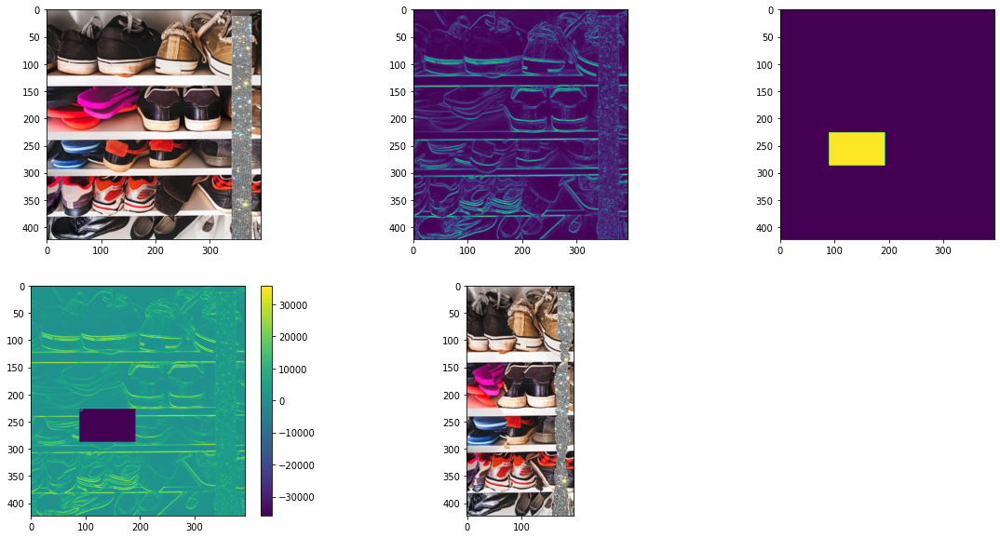

In [21]:
scale = 0.5
img_shoes = imread("shoes3.jpg")
# patch of the area we want to eliminate
energy_mask = color.rgb2gray(imread("energy_mask.jpg"))

en_map = energy_map(img_shoes)

# set large negative values in that patch
# to make more seams pass through it
en_map_edited = en_map.copy()
en_map_edited[energy_mask == 1] = -en_map.max()

out6 = seam_carve_horiz2(img_shoes, en_map_edited.copy(), scale)
# the desired portion has been removed
plt.subplot(2,3,1)
plt.imshow(img_shoes)
plt.subplot(2,3,2)
plt.imshow(en_map)
plt.subplot(2,3,3)
plt.imshow(energy_mask)
plt.subplot(2,3,4)
plt.imshow(en_map_edited)
plt.colorbar()
plt.subplot(2,3,5)
plt.imshow(out6)

We can use a similar strategy to make sure we keep some of the features in our image: we add 'artificial' energy (positive weights to a portion of the image) so that an area is more likely to be left untouched by the carving procedure. This kind of operation can be very useful when combined with a face detector, as seam carving often doesn't preserve the structure and position of face features.

100%|██████████| 197/197 [00:02<00:00, 94.69it/s] 


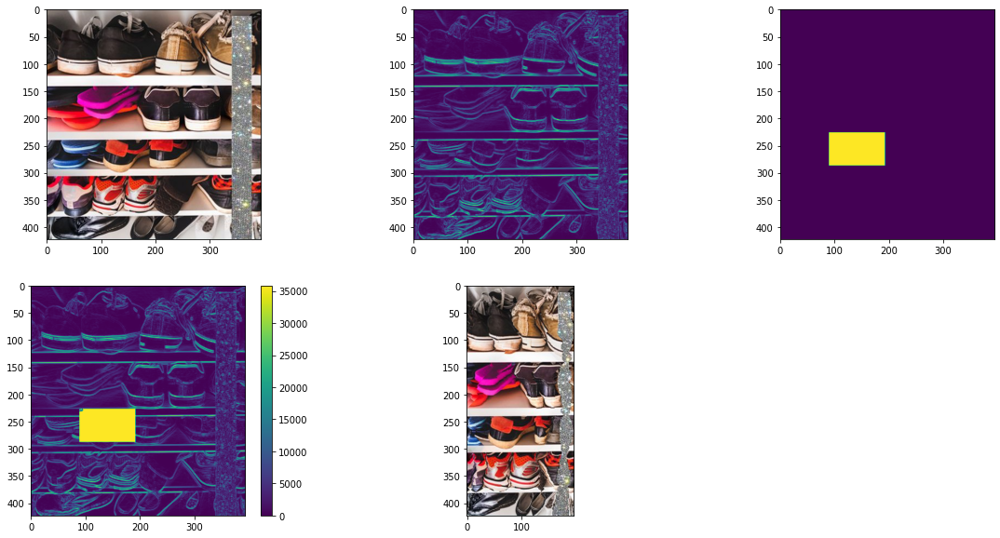

In [22]:
scale = 0.5

# patch of the area we want to keep
energy_mask = color.rgb2gray(imread("energy_mask.jpg"))

en_map = energy_map(img_shoes)

# set large positive values in that patch
en_map_edited = en_map.copy()
en_map_edited[energy_mask == 1] = en_map.max()

out6 = seam_carve_horiz2(img_shoes, en_map_edited.copy(), scale)
# the desired portion has not been carved
plt.subplot(2,3,1)
plt.imshow(img_shoes)
plt.subplot(2,3,2)
plt.imshow(en_map)
plt.subplot(2,3,3)
plt.imshow(energy_mask)
plt.subplot(2,3,4)
plt.imshow(en_map_edited)
plt.colorbar()
plt.subplot(2,3,5)
plt.imshow(out6)

# Forward energy
 What is clear from the examples above is that seam carving does not preserve straight lines (see also example below), however many artifacts and 'broken surfaces' can be avoided by adopting a different "forward" energy function:

The energy at each pixel will be determined by looking forward at the resulting image so that the next seam will be the one whose removal inserts the minimal amount of energy into the image (so not necessarely the one minimal in its energy).

This matches with the idea that images are piecewise smooth 2D-intensity-functions.

![Forward energy](forward.png)
Considering a pixel $P_{ij}$ carved by a column removal, there are 3 possible seams through it, if we consider the previous pixel row: removing the pixels in red causes new 'edges'/contact between pixel to be created, the ones marked as red lines.

We call the differences of intensity between pixels separated by the red line Cl, Cu and Cr (respectively for the 3 kind of seams)

$C_L(x,y) = |p_{[x-1,y]} - p_{[x+1,y]}| + |p_{[x,y-1]} - p_{[x-1,y]}|$

$C_U(x,y) = |p_{[x-1,y]} - p_{[x+1,y]}|$

$C_R(x,y) = |p_{[x-1,y]} - p_{[x+1,y]}| + |p_{[x,y-1]} - p_{[x+1,y]}|$

We than combine these 3 values as a singular value to be used in the minimum_seam procedure: we take the minimum of the 3.

$M(x,y)=min\begin{cases}M(x-1,y-1)+C_L(x,y) \\ M(x,y-1)+C_U(x,y) \\ M(x+1,y-1)+C_R(x,y) \end{cases}$

It's easy to see how we have even more degrees of freedom than before: we could choose different 'difference' functions for each $C$, but I'm going to stick with this basic formulation, considering the intensity of the grayscale version of the image.

100%|██████████| 186/186 [00:05<00:00, 34.19it/s]


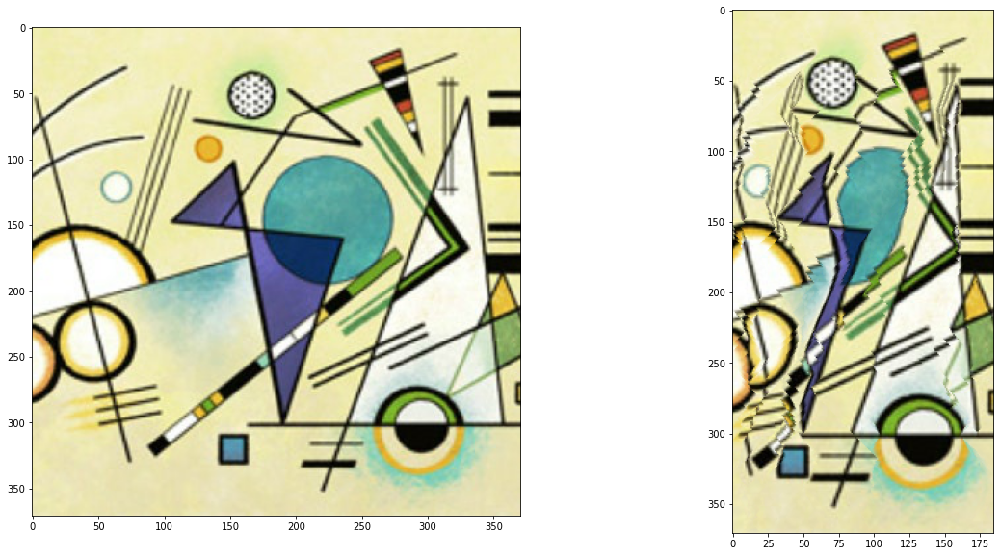

In [23]:
# seam carving does not preserve straight lines and might create artifacts
scale = 0.5
kandinsky = imread("kandinsky.jpg")
out_kandinsky = seam_carve_horiz(kandinsky, scale)

plt.subplot(1,2,1)
plt.imshow(kandinsky)
plt.subplot(1,2,2)
plt.imshow(out_kandinsky)

In [24]:
# here we try to use numpy as much as possible to speed up
# this intensive operation

@jit
def forward_energy_map(img):
    h, w, _ = img.shape
    
    energy = np.zeros((h, w)) # 
    m = np.zeros((h, w))
    
    I = color.rgb2gray(img) # again, grayscale for simplicity
    
    for i in range(1, h): # skip first row
        for j in range(w):
            # positions of the neighbor pixels: we consider image as part
            # of periodic repetition (% ensures that)
            up = (i - 1) % h
            left = (j - 1) % w
            right = (j + 1) % w
            # energy from neighbor ("previous") pixels
            mUp = m[up,j]
            mLeft = m[up,left]
            mRight = m[up,right]
            # energy difference as a result of the 3 possible cuts
            cUp = np.abs(I[i,right] - I[i,left])
            cLeft = np.abs(I[up,j] - I[i,left]) + cUp
            cRight = np.abs(I[up,j] - I[i,right]) + cUp
            
            cULR = np.array([cUp, cLeft, cRight])
            mULR = np.array([mUp, mLeft, mRight]) + cULR # previous energies + new from the cut
            # choose the minimum between the 3
            argmin = np.argmin(mULR)
            energy[i,j] = cULR[argmin] # min energy from cut in current pixel
            m[i,j] = mULR[argmin] # min energy in current pixel, cumulative with the cuts (cULR)
            
    return energy

<ipython-input-24-e7307d1174bb>:4: NumbaWarning: 
Compilation is falling back to object mode WITH looplifting enabled because Function "forward_energy_map" failed type inference due to: Unknown attribute 'rgb2gray' of type Module(<module 'skimage.color' from '/usr/local/lib/python3.7/dist-packages/skimage/color/__init__.py'>)

File "<ipython-input-24-e7307d1174bb>", line 11:
def forward_energy_map(img):
    <source elided>
    
    I = color.rgb2gray(img) # again, grayscale for simplicity
    ^

During: typing of get attribute at <ipython-input-24-e7307d1174bb> (11)

File "<ipython-input-24-e7307d1174bb>", line 11:
def forward_energy_map(img):
    <source elided>
    
    I = color.rgb2gray(img) # again, grayscale for simplicity
    ^

  @jit
<ipython-input-24-e7307d1174bb>:4: NumbaWarning: 
Compilation is falling back to object mode WITHOUT looplifting enabled because Function "forward_energy_map" failed type inference due to: cannot determine Numba type of <class 'numba.core.dispatch

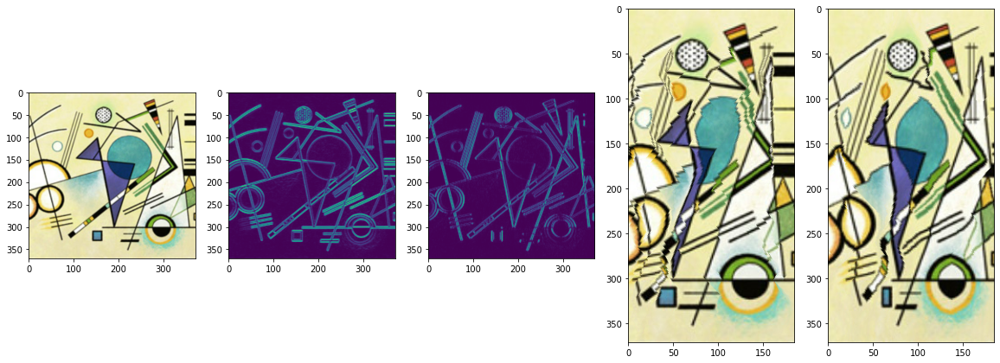

In [25]:
scale = 0.5
img_bench = imread("kandinsky.jpg")

# we can see that the resulting energy maps are different
backword_e_map = energy_map(img_bench)
forward_e_map = forward_energy_map(img_bench)
# also the result is different, not sure which one is better in this case
out_backward = seam_carve_horiz(img_bench, scale)
out_forward = seam_carve_horiz2(img_bench, forward_e_map, scale)

plt.subplot(1,5,1)
plt.imshow(img_bench)
plt.subplot(1,5,2)
plt.imshow(backword_e_map)
plt.subplot(1,5,3)
plt.imshow(forward_e_map)
plt.subplot(1,5,4)
plt.imshow(out_backward)
plt.subplot(1,5,5)
plt.imshow(out_forward)

100%|██████████| 144/144 [00:01<00:00, 112.69it/s]


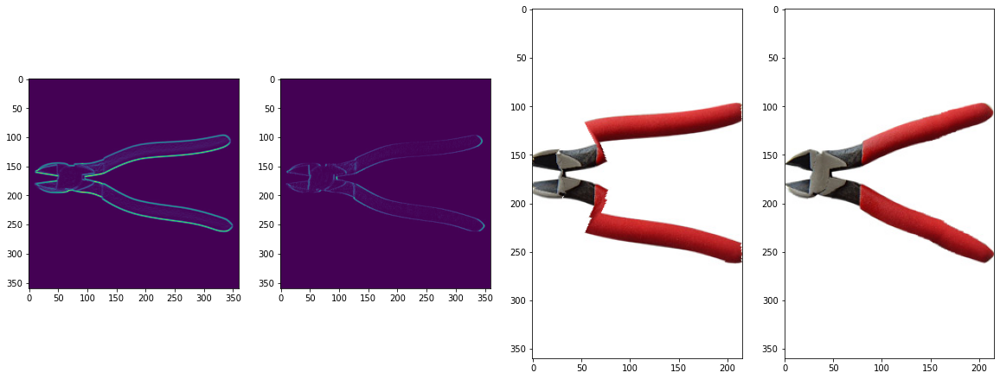

In [26]:
scale = 0.6
img_bench = imread("pliers.jpg")

backword_e_map = energy_map(img_bench)
forward_e_map = forward_energy_map(img_bench)

# much better carving with the forward energy here
out_backward = seam_carve_horiz(img_bench, scale)
out_forward = seam_carve_horiz2(img_bench, forward_e_map, scale)

plt.subplot(1,4,1)
plt.imshow(backword_e_map)
plt.subplot(1,4,2)
plt.imshow(forward_e_map)
plt.subplot(1,4,3)
plt.imshow(out_backward)
plt.subplot(1,4,4)
plt.imshow(out_forward)

100%|██████████| 397/397 [00:10<00:00, 37.86it/s]


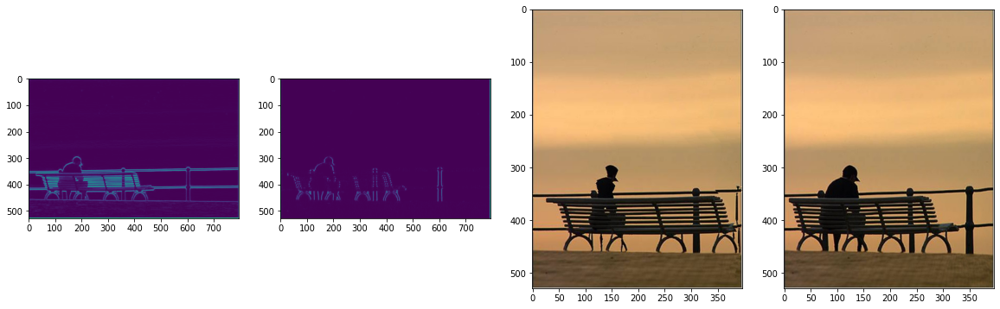

In [27]:
scale = 0.5
img_bench = imread("bench2.jpg")

backword_e_map = energy_map(img_bench)
forward_e_map = forward_energy_map(img_bench)

out_backward = seam_carve_horiz(img_bench, scale)
out_forward = seam_carve_horiz2(img_bench, forward_e_map, scale)

plt.subplot(1,4,1)
plt.imshow(backword_e_map)
plt.subplot(1,4,2)
plt.imshow(forward_e_map)
plt.subplot(1,4,3)
plt.imshow(out_backward)
plt.subplot(1,4,4)
plt.imshow(out_forward)

100%|██████████| 256/256 [00:02<00:00, 89.58it/s] 


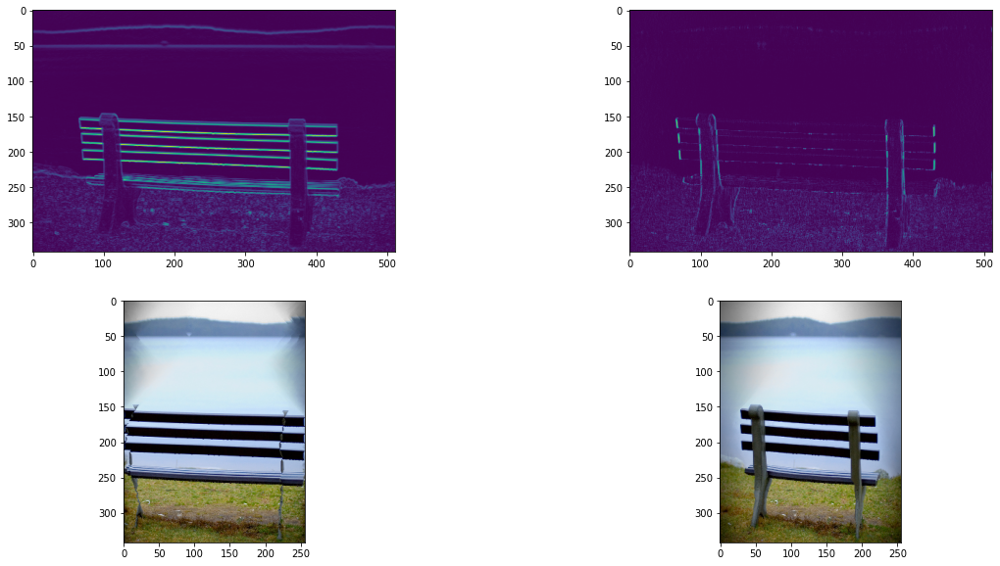

In [28]:
scale = 0.5
img_bench = imread("bench3.png")

backword_e_map = energy_map(img_bench)
forward_e_map = forward_energy_map(img_bench)
# very different results
out_backward = seam_carve_horiz(img_bench, scale)
out_forward = seam_carve_horiz2(img_bench, forward_e_map, scale)

plt.subplot(2,2,1)
plt.imshow(backword_e_map)
plt.subplot(2,2,2)
plt.imshow(forward_e_map)
plt.subplot(2,2,3)
plt.imshow(out_backward)
plt.subplot(2,2,4)
plt.imshow(out_forward)

As we can see, there is no criteria to establish in advance which energy function will generate the best image, but the forward energy version often produces much less visible "artifacts" / distortion / fractures.

## Examples of bad results

100%|██████████| 225/225 [00:03<00:00, 68.64it/s]


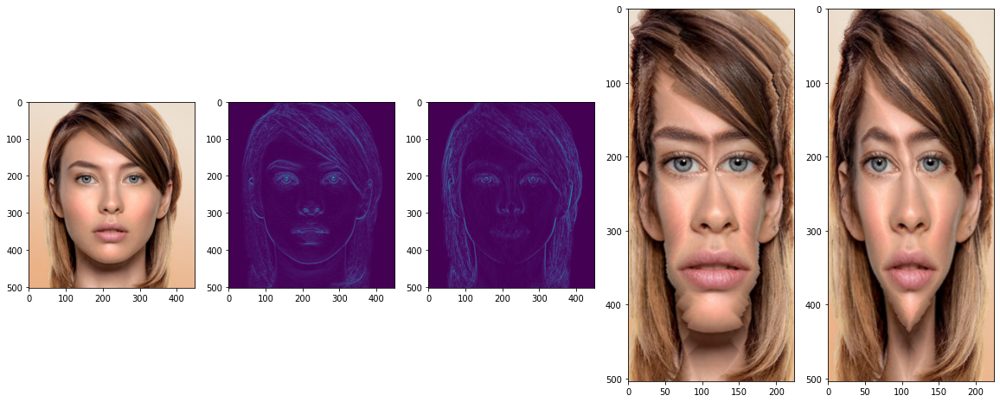

In [29]:
scale = 0.5
img_bench = imread("face.jpg")

backword_e_map = energy_map(img_bench)
forward_e_map = forward_energy_map(img_bench)

out_backward = seam_carve_horiz(img_bench, scale)
out_forward = seam_carve_horiz2(img_bench, forward_e_map, scale)
# human facial features produce the worst results when modified,
# no matter the energy function

plt.subplot(1,5,1)
plt.imshow(img_bench)
plt.subplot(1,5,2)
plt.imshow(backword_e_map)
plt.subplot(1,5,3)
plt.imshow(forward_e_map)
plt.subplot(1,5,4)
plt.imshow(out_backward)
plt.subplot(1,5,5)
plt.imshow(out_forward)

<ipython-input-24-e7307d1174bb>:4: NumbaWarning: 
Compilation is falling back to object mode WITH looplifting enabled because Function "forward_energy_map" failed type inference due to: Unknown attribute 'rgb2gray' of type Module(<module 'skimage.color' from '/usr/local/lib/python3.7/dist-packages/skimage/color/__init__.py'>)

File "<ipython-input-24-e7307d1174bb>", line 11:
def forward_energy_map(img):
    <source elided>
    
    I = color.rgb2gray(img) # again, grayscale for simplicity
    ^

During: typing of get attribute at <ipython-input-24-e7307d1174bb> (11)

File "<ipython-input-24-e7307d1174bb>", line 11:
def forward_energy_map(img):
    <source elided>
    
    I = color.rgb2gray(img) # again, grayscale for simplicity
    ^

  @jit
<ipython-input-24-e7307d1174bb>:4: NumbaWarning: 
Compilation is falling back to object mode WITHOUT looplifting enabled because Function "forward_energy_map" failed type inference due to: cannot determine Numba type of <class 'numba.core.dispatch

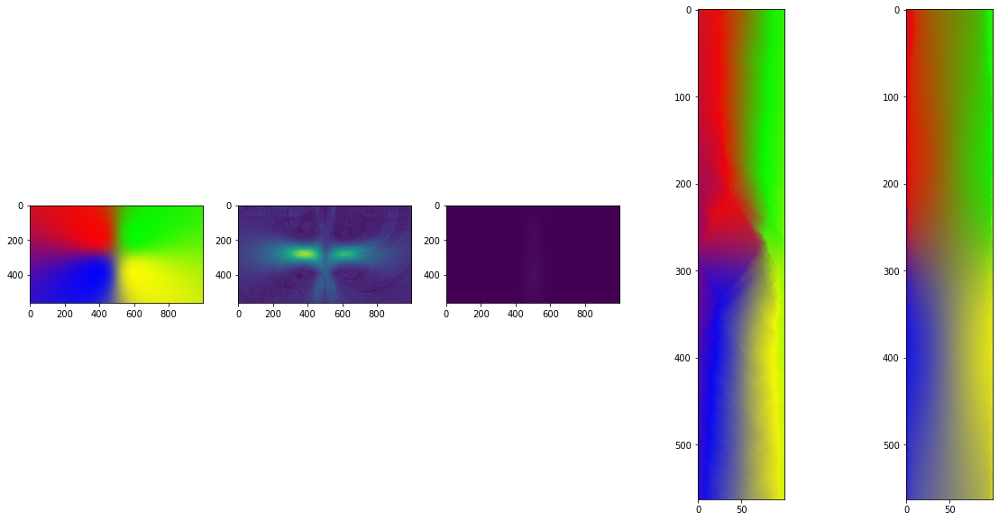

In [30]:
scale = 0.1
img_bench = imread("gradient3.png")[:,:,:3]

backword_e_map = energy_map(img_bench)
forward_e_map = forward_energy_map(img_bench)

out_backward = seam_carve_horiz(img_bench, scale)
out_forward = seam_carve_horiz2(img_bench, forward_e_map, scale)
# difficult to rescale a scale with a gradient by carving while
# maintaining a decent "smoothness". The forward energy map does it better

plt.subplot(1,5,1)
plt.imshow(img_bench)
plt.subplot(1,5,2)
plt.imshow(backword_e_map)
plt.subplot(1,5,3)
plt.imshow(forward_e_map)
plt.subplot(1,5,4)
plt.imshow(out_backward)
plt.subplot(1,5,5)
plt.imshow(out_forward)

100%|██████████| 250/250 [00:02<00:00, 91.68it/s] 


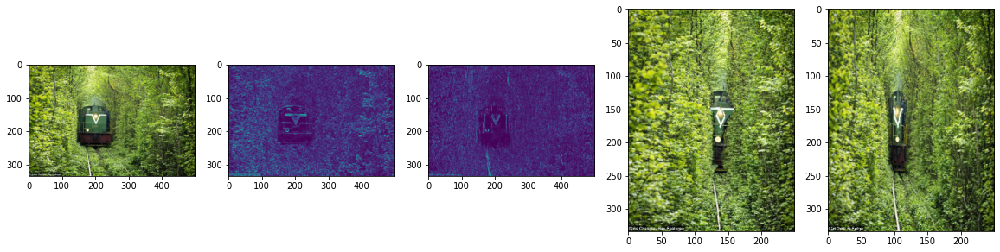

In [31]:
scale = 0.5
img_bench = imread("train.jpg")

backword_e_map = energy_map(img_bench)
forward_e_map = forward_energy_map(img_bench)

out_backward = seam_carve_horiz(img_bench, scale)
out_forward = seam_carve_horiz2(img_bench, forward_e_map, scale)
# this image is a simple one but it is one of the worst to apply seam carving to:
# in this case it's the subject that gets carved out because its lack of
# detail, while the "useless" leaves surrounding it carry much more variations/energy.
# in this case, a eye-movement map would be better as energy function, as the train
# will probably be the focus of interest, being the subject.

plt.subplot(1,5,1)
plt.imshow(img_bench)
plt.subplot(1,5,2)
plt.imshow(backword_e_map)
plt.subplot(1,5,3)
plt.imshow(forward_e_map)
plt.subplot(1,5,4)
plt.imshow(out_backward)
plt.subplot(1,5,5)
plt.imshow(out_forward)

# Computational aspect

Once we have an energy map for the image, carving out 1 seam with dynamic programming is a quite efficent task, with time complexity $O(MN)$, where $M$ and $N$ are the dimentions of the image.

What is really expensive is computing the energy map at every step, each time a seam has to be applied: to takle this problem, many variations of this algorithm exist: from applying efficent graph-cut or k-means techniques to avoid the dynamic programming step, or to extract multiple seams at each step to make use of a single energy map calculation.
Many of these variations can take advantage from parallel GPU computation to speed up the process.

Similar seam carving techniques also exist on videos, focusing also not to create distortion in the time domain (very different seams across contiguous frames).


# Effectiveness and conclusions

Seam carving is a simple algorithm that can work quite well in some kinds of images: mainly those that have wide undetailed spaces (such as a clear sky or a plain wall) against well-defined detailed subjects. It often has to be combined by facial/presence detection routines to preserve structure of human features, but it is not a satisfactory solution for image retargeting in general, as the results can vary widely depending on the image.

A 2010 review of eight image retargeting methods found that seam carving produced output that was ranked among the worst of the tested algorithms. It was, however, a part of one of the highest-ranking algorithms: the multi-operator extension mentioned above (when combined with cropping and scaling): https://people.csail.mit.edu/mrub/retargetme/
